## Analysis of Human Head and Neck Squamous Cell Carcinoma samples from *Zheng et al.* in Nature Communications published in 2020. __[(GSE145370)](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE145370)__


#### Load in required libraries

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
import scvi
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt
import seaborn as sns

/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### Load in the processed data set after scvi-tools normalization

In [ ]:
adata_combined = sc.read_h5ad('Zheng_NatCom_2020/Data/normalized_scvi.h5ad')

In [5]:
adata_combined.var_names_make_unique

<bound method AnnData.var_names_make_unique of AnnData object with n_obs × n_vars = 106027 × 21320
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels'
    var: 'n_cells'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'log1p', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'Counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'>

#### Here we use the leiden algorithm to generate clustering of cell types which we can visualize the HSCC data using umap

In [6]:
sc.tl.umap(adata_combined)
sc.tl.leiden(adata_combined, resolution = 0.5)

#### As we can see the matched normal and tumor data mixed together quite well however, we can see some distinct populations in the tumor only group and some populations that are biased to either tumor or normal.

/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categoric

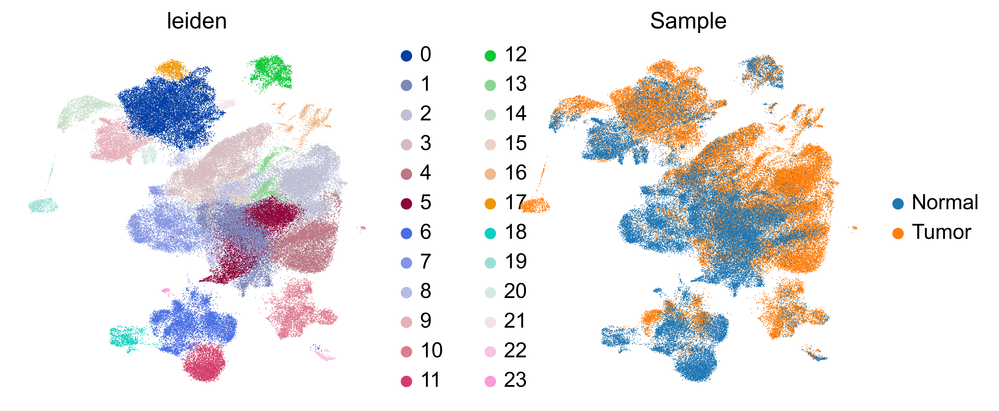

In [7]:
sc.pl.umap(adata_combined, color = ['leiden', 'Sample'], frameon = False)

/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


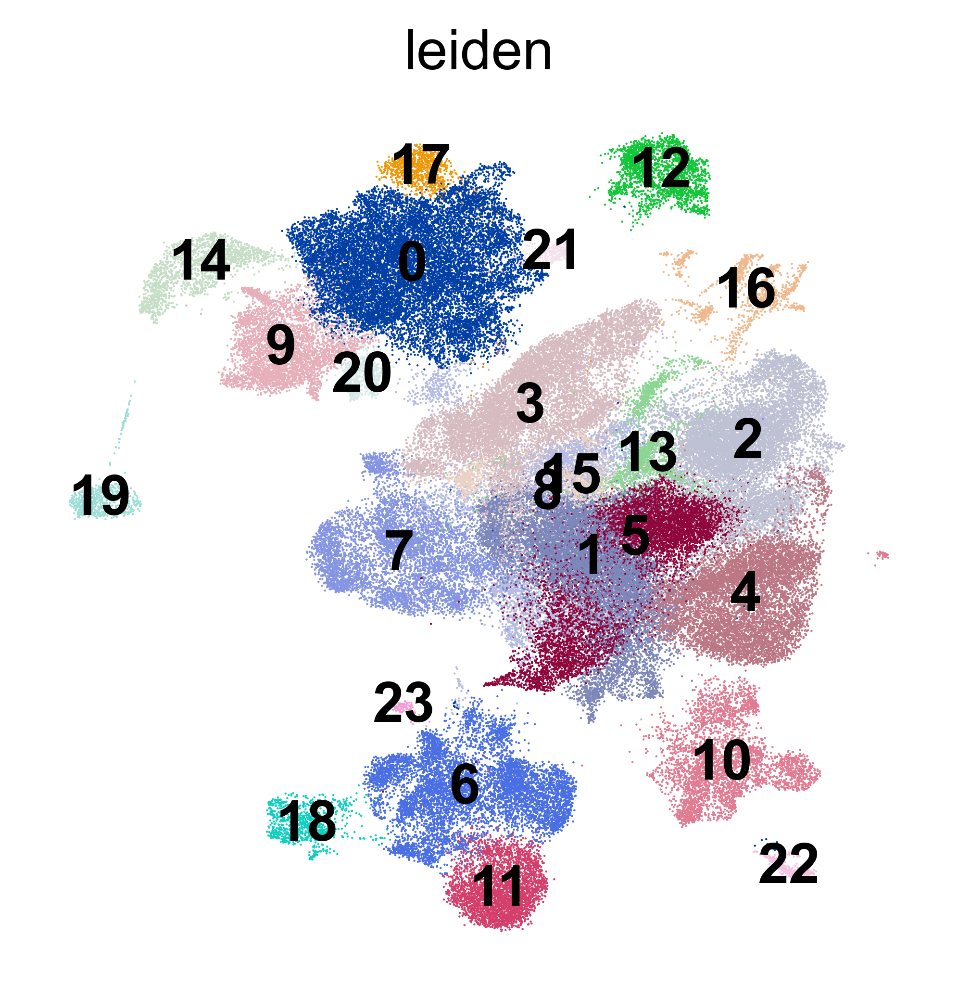

In [8]:
sc.pl.umap(adata_combined, color = ['leiden'], frameon = False, legend_loc = "on data")

#### Load back in the scvi.model from the preprocessing step

In [9]:
scvi_model = scvi.model.SCVI.load('Zheng_NatCom_2020/Data/', adata_combined)

INFO     File Zheng_NatCom_2020/Data/model.pt already downloaded                                                   


/Users/jordon/anaconda3/envs/analysis/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


#### To generate unique cell markers/transcripts for each cell cluster we will use the differential expression module in scvi-tools to compare each individual leiden cluster to every other cluster

In [10]:
markers = scvi_model.differential_expression(groupby='leiden')

DE...:   0%|          | 0/24 [00:00<?, ?it/s]

/Users/jordon/anaconda3/envs/analysis/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


DE...: 100%|██████████| 24/24 [37:01<00:00, 92.56s/it]


#### To find true hits, a filter of <=0.05 for the False Discovery rate and at least a log fold change of 0.5

In [11]:
markers = markers[(markers['is_de_fdr_0.05']) & (markers.lfc_mean > .5)]

In [12]:
markers

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
CD1B,0.9962,0.0038,5.568944,3.601809e-05,1.427888e-06,0.0,0.25,6.627545,6.787744,2.753071,...,0.090502,0.002289,0.050271,0.000953,0.141270,0.003115,True,0 vs Rest,0,Rest
IGSF21,0.9944,0.0056,5.179371,2.087612e-05,3.315955e-07,0.0,0.25,6.825461,6.880026,3.115972,...,0.043419,0.000088,0.031004,0.000077,0.094581,0.000195,True,0 vs Rest,0,Rest
CLEC4F,0.9944,0.0056,5.179371,1.951975e-05,8.630018e-07,0.0,0.25,6.502056,6.482570,3.082582,...,0.053935,0.001786,0.034125,0.001402,0.081254,0.003193,True,0 vs Rest,0,Rest
FPR3,0.9944,0.0056,5.179371,1.562824e-04,1.180282e-05,0.0,0.25,6.192928,6.396820,2.677606,...,0.603984,0.027397,0.349661,0.010286,1.345496,0.055103,True,0 vs Rest,0,Rest
TMEM51,0.9944,0.0056,5.179371,5.456879e-05,3.688426e-06,0.0,0.25,6.287621,6.592246,2.675919,...,0.261740,0.008654,0.194708,0.006616,0.470593,0.018222,True,0 vs Rest,0,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERICH3,0.9220,0.0780,2.469836,1.295937e-06,2.835742e-06,0.0,0.25,0.679814,0.833773,2.337618,...,0.000000,0.001756,0.000000,0.001492,0.000000,0.006493,True,23 vs Rest,23,Rest
AC009948.3,0.9220,0.0780,2.469836,1.702309e-06,7.675121e-07,0.0,0.25,1.421927,1.461730,1.230793,...,0.010309,0.000944,0.010309,0.000944,0.032562,0.003934,True,23 vs Rest,23,Rest
SF3B1,0.9220,0.0780,2.469836,3.781868e-04,1.963058e-04,0.0,0.25,1.129569,1.114810,0.792505,...,0.742268,0.494777,0.525773,0.350137,3.053625,1.863148,True,23 vs Rest,23,Rest
ZNF449,0.9220,0.0780,2.469836,4.794828e-06,2.201947e-06,0.0,0.25,1.456235,1.448294,1.250280,...,0.000000,0.004588,0.000000,0.004541,0.000000,0.016459,True,23 vs Rest,23,Rest


#### After analzying unique markers for each cluster as well as more well known general markers the following cell labels could be generated. **Note these cell labels are very general and could be even more specific but for the purpose of this project these cells labels are adequate**

In [142]:
cell_type = {
"0": "Macrophage",
"1":"NK T cells",
"2":"Exhausted CD8 T cells",
"3":"CD8 T cells",
"4":"CD4 T cells",
"5":"Gamma Delta T cells",
"6":"B cells",
"7":"Gamma Delta T cells",
"8":"CD8 T cells",
"9":"DCs",
"10":"B cells",
"11":"B cells",
"12":"Mast Cells",
"13":"NK Cells",
"14":"DCs",
"15":"CD4 T cells",
"16":"CD8 T cells",
"17":"Macrophages",
"18":"B cells",
"19":"Monocytes",
"20":"Monocytes",
"21":"Monocytes",
"22":"pDCs",
"23":"B cells"
}

In [143]:
adata_combined.obs['cell type'] = adata_combined.obs.leiden.map(cell_type)

/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


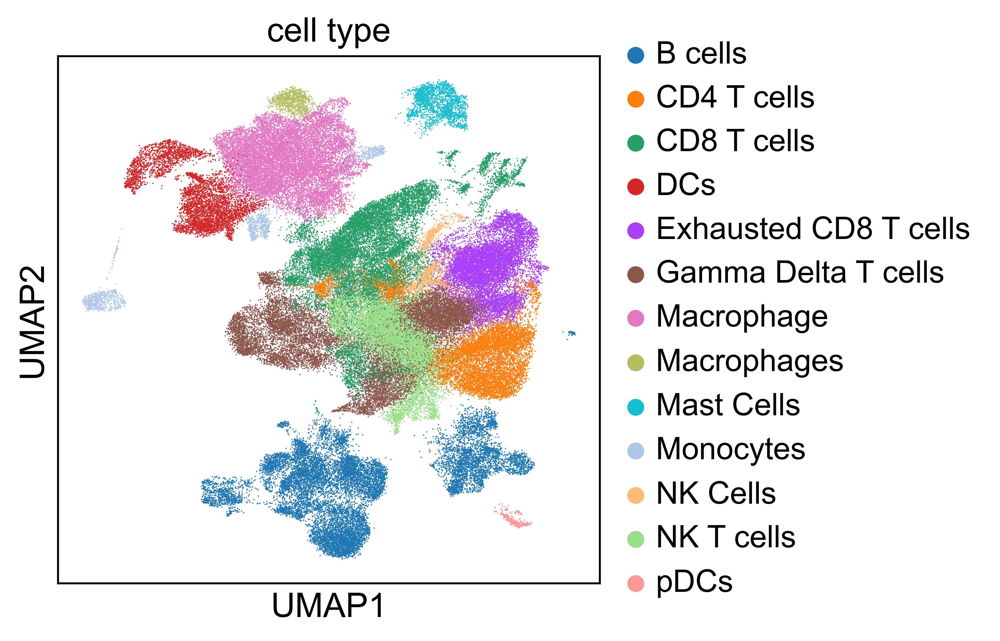

In [144]:
sc.pl.umap(adata_combined, color = ['cell type'], frameon = True)

In [145]:
adata_combined.uns['markers'] = markers

#### Now we can save the annotated anndata for future analysis if need be.

In [146]:
adata_combined.write_h5ad('annotated.h5ad')

#### We can visualize the frequency of cell populations between matched normal and tumor samples by creating a dataframe with all the data we need from our annadata object 'adata_combined'

In [148]:
total_cells = adata_combined.obs.groupby(['Sample']).count()
total_cells = dict(zip(total_cells.index, total_cells.total_counts))

/var/folders/4q/qqc0xmp51dlbr5kzfjbfzkv40000gn/T/ipykernel_21520/178365170.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_cells = adata_combined.obs.groupby(['Sample']).count()


In [150]:
cell_type_counts = adata_combined.obs.groupby(['Sample', 'cell type']).count()
cell_type_counts = cell_type_counts[cell_type_counts.sum(axis=1) > 0].reset_index()
cell_type_counts = cell_type_counts[cell_type_counts.columns[0:3]]


/var/folders/4q/qqc0xmp51dlbr5kzfjbfzkv40000gn/T/ipykernel_21520/1374708501.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_type_counts = adata_combined.obs.groupby(['Sample', 'cell type']).count()


#### Now we have cleaned up the data to only include the relevant information

In [151]:
cell_type_counts

,Sample,cell type,n_genes
0,Normal,B cells,9233
1,Normal,CD4 T cells,2309
2,Normal,CD8 T cells,3915
3,Normal,DCs,3592
4,Normal,Exhausted CD8 T cells,444
5,Normal,Gamma Delta T cells,10047
6,Normal,Macrophage,2383
7,Normal,Macrophages,39
8,Normal,Mast Cells,996
9,Normal,Monocytes,517


#### Now just call some basic math functions to generate a frequency value which we can plot in seaborn/matplotlib

In [152]:
cell_type_counts['Total_Counts'] = cell_type_counts.Sample.map(total_cells).astype(int)
cell_type_counts['Frequency'] = cell_type_counts.n_genes/ cell_type_counts.Total_Counts
cell_type_counts

,Sample,cell type,n_genes,Total_Counts,Frequency
0,Normal,B cells,9233,40928,0.225591
1,Normal,CD4 T cells,2309,40928,0.056416
2,Normal,CD8 T cells,3915,40928,0.095656
3,Normal,DCs,3592,40928,0.087764
4,Normal,Exhausted CD8 T cells,444,40928,0.010848
5,Normal,Gamma Delta T cells,10047,40928,0.245480
6,Normal,Macrophage,2383,40928,0.058224
7,Normal,Macrophages,39,40928,0.000953
8,Normal,Mast Cells,996,40928,0.024335
9,Normal,Monocytes,517,40928,0.012632


/Users/jordon/anaconda3/envs/analysis/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


<Figure size 3000x1200 with 0 Axes>

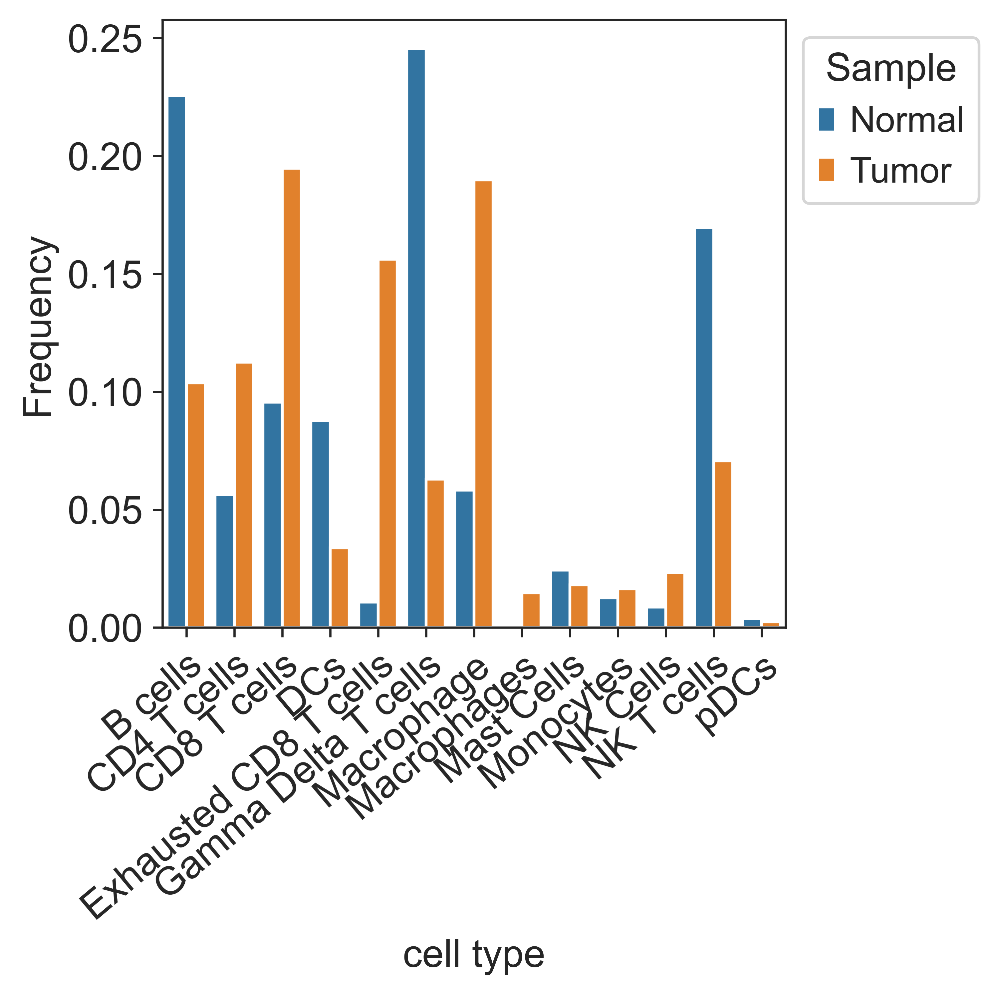

In [173]:
plt.figure(figsize=(10,4))
plt.figure(dpi=300)

sns.set_style("ticks")
g = sns.barplot(cell_type_counts, x = 'cell type', y= 'Frequency', hue = 'Sample')
plt.xticks(rotation = 40, rotation_mode = 'anchor', ha = 'right')
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))
plt.show()



## CellPhoneDB

#### We're going to use a tool called CellPhoneDB to look at cell-cell communication through receptor-ligand complexes of immune cells in the HSCC samples. CellPhoneDB was developed by the __[Teichmann Lab](https://github.com/ventolab/CellphoneDB?tab=readme-ov-file)__.

#### There are three required files types for CellPhoneDB:
1. CellPhoneDB source file (see the github on how to install this)
2. Metadatafile
3. Counts file

#### 2. Metadata file frame. This file consists of the barcodes as well as the cell labels. We can prepare this data by manipulating the previously used anndata and expodting to a tsv file. 

In [116]:
metdat = sc.read_h5ad('Zheng_NatCom_2020/Data/annotated.h5ad')

In [117]:
metdat.obs_names_make_unique()

In [130]:
cdb_metadata = metdat.obs[['Sample','cell type']]

In [131]:
cdb_metadata = cdb_metadata[cdb_metadata['Sample'] == 'Tumor']

In [ ]:
cdb_metadata = cdb_metadata.drop(columns='Sample')

In [134]:
cdb_metadata.index.names = ['barcode_samples']

In [136]:
cdb_metadata = cdb_metadata.rename(columns={'cell type':'cell_label'})

In [137]:
cdb_metadata

,cell_label
barcode_samples,
AAACCTGAGACAAAGG-1,CD4 T cells
AAACCTGAGCGCCTCA-1,Exhausted CD8 T cells
AAACCTGAGCGTGTCC-1,Exhausted CD8 T cells
AAACCTGCACTTCTGC-1,CD4 T cells
AAACCTGCAGACAGGT-1,Exhausted CD8 T cells
...,...
TTTGTCAGTTAGTGGG-1,DCs
TTTGTCATCATGTCTT-1,NK T cells
TTTGTCATCTACTATC-1-1,CD8 T cells


In [138]:
cdb_metadata.to_csv('tumor_metadata.tsv', sep='\t')

#### 3. Counts file. Similar to the metadata we can manipulate the anndata from before to be in the appropriate format. It is key for both of these file types to have the index labelled as the same label (ex. barcode_sample). We then save this file as a h5ad file OR we can call the object directly later on if it is loaded already.

In [217]:
cdb_counts = adata_combined[adata_combined.obs.Sample == 'Tumor']

In [109]:
cdb_counts.obs_names_make_unique()

In [139]:
cdb_counts.obs['cell_label'] = cdb_metadata['cell_label']

In [141]:
cdb_counts.obs = cdb_counts.obs.drop(columns='n_genes_by_counts')
cdb_counts.obs = cdb_counts.obs.drop(columns='Sample')
cdb_counts.obs = cdb_counts.obs.drop(columns='total_counts_mt')
cdb_counts.obs = cdb_counts.obs.drop(columns='pct_counts_mt')

In [143]:
cdb_counts.obs.index.names = ['barcode_samples']

In [145]:
cdb_counts.write_h5ad('cdb_counts.h5ad')

### Load the appropriate module from cellphoneDB library to run the statistical analysis method:
#### In the statistical method empirical shuffling is used to generate a null distirbution of the meanof the average ligand receptor expression in the interacting clusters by randomly permuting (by defualt 1000 permutations) the cluster labels of all cells. 


In [17]:
from cellphonedb.src.core.methods import cpdb_statistical_analysis_method

In [146]:

cpdb_results = cpdb_statistical_analysis_method.call(
    cpdb_file_path = 'Zheng_NatCom_2020/CellPhoneDB/v5.0.0/cellphonedb.zip',                 # mandatory: CellphoneDB database zip file.
    meta_file_path = 'Zheng_NatCom_2020/Data/tumor_metadata.tsv',                 # mandatory: tsv file defining barcodes to cell label.
    counts_file_path = 'Zheng_NatCom_2020/Data/cdb_counts.h5ad',             # mandatory: normalized count matrix - a path to the counts file, or an in-memory AnnData object
    counts_data = 'hgnc_symbol',                     # defines the gene annotation in counts matrix.
    score_interactions = True,                       
    iterations = 1000,                               # denotes the number of shufflings performed in the analysis.
    threshold = 0.1,                                 # defines the min % of cells expressing a gene for this to be employed in the analysis.
    threads = 5,                                     
    debug_seed = 42,                                 
    result_precision = 3,                            # Sets the rounding for the mean values in significan_means.
    pvalue = 0.05,                                   # P-value threshold to employ for significance.
    subsampling = False,                             # To enable subsampling the data (geometri sketching).
    subsampling_log = False,                         
    subsampling_num_pc = 100,                        
    subsampling_num_cells = 1000,                    
    separator = '|',                                 
    debug = False,                                  
    output_path = 'Zheng_NatCom_2020/Data',                          # Path to save results.
    output_suffix = None                             
    )

Reading user files...
The following user files were loaded successfully:
Zheng_NatCom_2020/Data/cdb_counts.h5ad
Zheng_NatCom_2020/Data/tumor_metadata.tsv
[ ][CORE][13/02/24-00:29:28][INFO] [Cluster Statistical Analysis] Threshold:0.1 Iterations:1000 Debug-seed:42 Threads:5 Precision:3
[ ][CORE][13/02/24-00:29:29][WARNING] Debug random seed enabled. Set to 42
[ ][CORE][13/02/24-00:29:35][INFO] Running Real Analysis
[ ][CORE][13/02/24-00:29:35][INFO] Running Statistical Analysis


100%|██████████| 1000/1000 [17:44<00:00,  1.06s/it]

[ ][CORE][13/02/24-00:47:21][INFO] Building Pvalues result


[ ][CORE][13/02/24-00:47:21][INFO] Building results
[ ][CORE][13/02/24-00:47:21][INFO] Scoring interactions: Filtering genes per cell type..


100%|██████████| 13/13 [00:01<00:00,  9.28it/s]

[ ][CORE][13/02/24-00:47:23][INFO] Scoring interactions: Calculating mean expression of each gene per group/cell type..



100%|██████████| 13/13 [00:00<00:00, 29.67it/s]


[ ][CORE][13/02/24-00:47:24][INFO] Scoring interactions: Calculating scores for all interactions and cell types..


100%|██████████| 169/169 [00:53<00:00,  3.16it/s]


Saved deconvoluted to Zheng_NatCom2020/Data/statistical_analysis_deconvoluted_02_13_2024_004818.txt
Saved deconvoluted_percents to Zheng_NatCom2020/Data/statistical_analysis_deconvoluted_percents_02_13_2024_004818.txt
Saved means to Zheng_NatCom2020/Data/statistical_analysis_means_02_13_2024_004818.txt
Saved pvalues to Zheng_NatCom2020/Data/statistical_analysis_pvalues_02_13_2024_004818.txt
Saved significant_means to Zheng_NatCom2020/Data/statistical_analysis_significant_means_02_13_2024_004818.txt
Saved interaction_scores to Zheng_NatCom2020/Data/statistical_analysis_interaction_scores_02_13_2024_004818.txt


##### Here is the resulting outputs we get from our analysis, we can now use these to generate visualizations

In [147]:
list(cpdb_results.keys())

['deconvoluted',
 'deconvoluted_percents',
 'means',
 'pvalues',
 'significant_means',
 'CellSign_active_interactions',
 'CellSign_active_interactions_deconvoluted',
 'interaction_scores']

##### Using the search utils we can parse the results to look at specific interactions between user-defined cell types/labels and pass it to a new dataframe

In [153]:
from cellphonedb.utils import search_utils

search_res = search_utils.search_analysis_results(
    query_cell_types_1 = ['DCs', 'Macrophages', 'Monocytes', 'Macrophage'],
    query_cell_types_2 = ['Exhausted CD8 T cells', 'CD4 T cells', 'CD8 T cells'],
    significant_means = cpdb_results['significant_means'],
    deconvoluted = cpdb_results['deconvoluted'],
    interaction_scores = cpdb_results['interaction_scores'],
    query_minimum_score = 50,
    separator = '|',
    long_format = True,
)

In [154]:
search_res.head()

,interacting_pair,partner_a,partner_b,gene_a,gene_b,directionality,classification,interacting_cells,significant_mean
6,LTA_TNFRSF1A,simple:P01374,simple:P19438,LTA,TNFRSF1A,Ligand-Receptor,Signaling by Tumor necrosis factor,CD4 T cells|DCs,0.332
8,CD177_PECAM1,simple:Q8N6Q3,simple:P16284,CD177,PECAM1,Ligand-Receptor,NaN,CD4 T cells|DCs,0.263
15,LTA_TNFRSF1B,simple:P01374,simple:P20333,LTA,TNFRSF1B,Ligand-Receptor,Signaling by Tumor necrosis factor,CD4 T cells|DCs,0.542
17,LPAR2_ADGRE5,simple:Q9HBW0,simple:P48960,LPAR2,ADGRE5,Receptor-Receptor,Signaling by Lysophosphatidic acid receptor,CD4 T cells|DCs,0.386
24,LTA_TNFRSF14,simple:P01374,simple:Q92956,LTA,TNFRSF14,Ligand-Receptor,Signaling by Tumor necrosis factor,CD4 T cells|DCs,0.362


## Plotting of CellPhoneDB Outputs

##### Load in the required libraries for data visualization, of note the authors of the CellPhoneDB package recommend using the ktplotspy library as it works more organically with the dataframes we generated from CellPhoneDB

In [155]:
import os 
import anndata as ad 
import pandas as pd
import ktplotspy as kpy 
import matplotlib.pyplot as plt
%matplotlib inline

#### First Plot: Looking at the significance of all cell-cell interactions in the HNSCC data

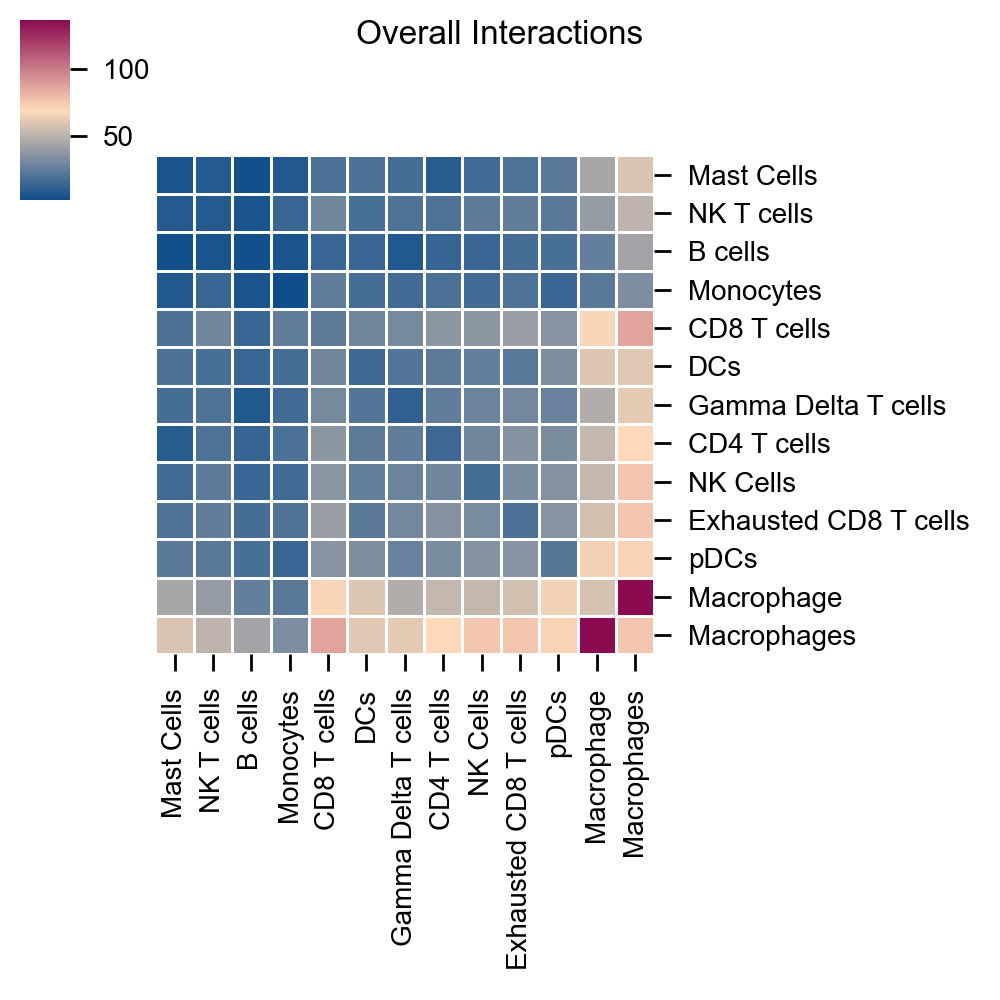

In [172]:
p1 = kpy.plot_cpdb_heatmap(pvals = cpdb_results['pvalues'],
                      degs_analysis = False,
                      figsize = (5,5),
                      title = "Overall Interactions")

p1.savefig('Overall Interactions.pdf')

#### Second Plot: A more granular approach to looking at specific interactions between certain cell types (All types of DCs and T cells)

In [174]:
p2 = kpy.plot_cpdb(
adata = cdb_counts,
cell_type1 = "DCs",
cell_type2 = "Exhausted CD8 T cells|CD8 T cells|CD4 T cells",
means = cpdb_results['means'],
pvals = cpdb_results['pvalues'],
celltype_key ='cell_label',
figsize = (10,10),
title = "Interaction of DCs and T cells",
max_size = 3, 
highlight_size=0.75,
degs_analysis=False,
standard_scale=True,
default_style = False,
interaction_scores = cpdb_results['interaction_scores'],
scale_alpha_by_interaction_scores=True
)

p2.save('DC and T cell Interactions.pdf')

#### Third Plot: Similar to plot 2 but this time its looking at macrophages and T cells

In [175]:
p3 = kpy.plot_cpdb(
adata = cdb_counts,
cell_type1 = "Macrophages",
cell_type2 = "Exhausted CD8 T cells|CD8 T cells|CD4 T cells",
means = cpdb_results['means'],
pvals = cpdb_results['pvalues'],
celltype_key ='cell_label',
figsize = (12,12),
title = "Interaction of Mo and T cells",
max_size = 3, 
highlight_size=0.75,
degs_analysis=False,
standard_scale=True,
interaction_scores = cpdb_results['interaction_scores'],
scale_alpha_by_interaction_scores=True
)

p3.save('Macrophage and T cell interactions.pdf')